### Single object mask combined on original image with 50 percent transaprency

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!


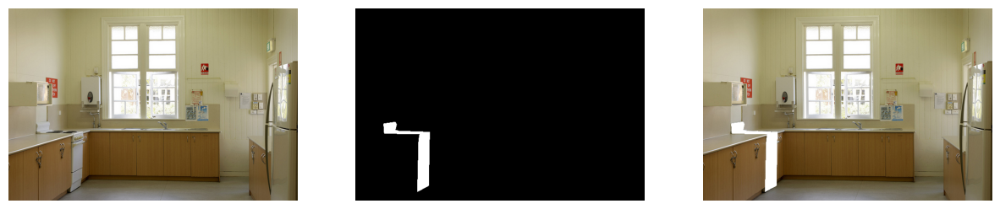

True

In [ ]:
import os
import random
import zipfile
import glob
import cv2
import numpy as np
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import matplotlib.pyplot as plt

def download_file(url, dst):
    if not os.path.exists(dst):
        os.system(f"wget -c {url} -O {dst}")

def extract_zip(zip_path, extract_to="."):
    if not os.path.exists(extract_to) or not os.listdir(extract_to):
        with zipfile.ZipFile(zip_path, "r") as z:
            z.extractall(extract_to)


download_file("http://images.cocodataset.org/zips/val2017.zip", "val2017.zip")
extract_zip("val2017.zip", "val2017")
download_file("http://images.cocodataset.org/annotations/annotations_trainval2017.zip",
              "annotations_trainval2017.zip")
extract_zip("annotations_trainval2017.zip", "annotations")

# ---------- Robust annotation path ----------
ann_file = "annotations/instances_val2017.json"
if not os.path.exists(ann_file):
    nested_path = os.path.join("annotations", "annotations", "instances_val2017.json")
    if os.path.exists(nested_path):
        ann_file = nested_path
    else:
        raise FileNotFoundError(f"Cannot find {ann_file} or nested path.")


img_dir = "val2017"
coco = COCO(ann_file)


img_id = random.choice(coco.getImgIds())
img_info = coco.loadImgs(img_id)[0]

img_name = img_info['file_name']
possible_paths = glob.glob(f"{img_dir}/**/{img_name}", recursive=True)
if not possible_paths:
    raise FileNotFoundError(f"Could not find image {img_name} in {img_dir}")
img_path = possible_paths[0]

image = cv2.imread(img_path)
if image is None:
    raise FileNotFoundError(f"Failed to read image: {img_path}")
h, w = image.shape[:2]


ann_ids = coco.getAnnIds(imgIds=img_id)
if not ann_ids:
    raise ValueError("No objects found in this image")
ann = coco.loadAnns([random.choice(ann_ids)])[0]

seg = ann['segmentation']
mask = np.zeros((h, w), dtype=np.uint8)
if isinstance(seg, list):
    rles = mask_utils.frPyObjects(seg, h, w)
    rle = mask_utils.merge(rles)
else:
    rle = seg
mask = mask_utils.decode(rle)


overlay = image.copy()
overlay = cv2.addWeighted(overlay, 0.5, overlay, 0.5, 0)  # background 50% transparent
overlay[mask == 1] = 255  # object white


plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(mask, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


out_name = f"overlay_oneobj_white_{img_info['file_name'].replace('.jpg', '.png')}"
cv2.imwrite(out_name, overlay)


## Multiple subjects masks combined

loading annotations into memory...
Done (t=0.35s)
creating index...
index created!


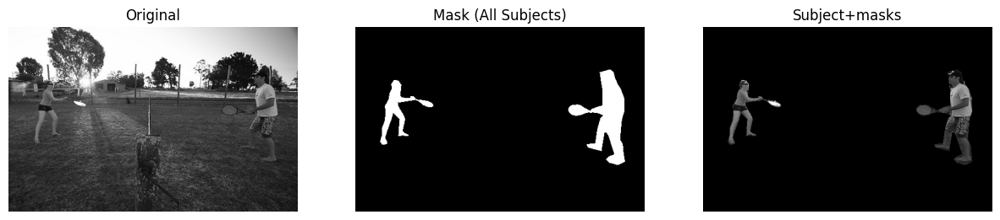

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import pycocotools.mask as mask_utils
import random
import glob

# --- Paths ---
ann_file = "annotations/annotations/instances_val2017.json"
img_dir = "val2017"

# --- Load COCO ---
coco = COCO(ann_file)

# --- Pick a random image ---
img_ids = coco.getImgIds()
img_id = random.choice(img_ids)
img_info = coco.loadImgs([img_id])[0]

# --- Find the image file recursively ---
img_file = img_info['file_name']
possible_paths = glob.glob(f"{img_dir}/**/{img_file}", recursive=True)
if not possible_paths:
    raise FileNotFoundError(f"Could not find {img_file} in {img_dir}")
img_path = possible_paths[0]

# --- Load image ---
image = cv2.imread(img_path)
if image is None:
    raise FileNotFoundError(f"Failed to read {img_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]

# --- Load all annotations ---
ann_ids = coco.getAnnIds(imgIds=[img_id])
anns = coco.loadAnns(ann_ids)

# --- Build combined mask for all subjects ---
mask = np.zeros((h, w), dtype=np.uint8)
for ann in anns:
    seg = ann['segmentation']
    if isinstance(seg, list):  # polygons
        rles = mask_utils.frPyObjects(seg, h, w)
        rle = mask_utils.merge(rles)
        m = mask_utils.decode(rle)
    elif isinstance(seg, dict) and "counts" in seg:  # already RLE
        m = mask_utils.decode(seg)
    else:
        continue
    mask = np.maximum(mask, m)


overlay = np.zeros_like(image)
overlay[mask == 1] = image[mask == 1]


plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(image); plt.axis('off'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(mask, cmap='gray'); plt.axis('off'); plt.title("Mask (All Subjects)")
plt.subplot(1,3,3); plt.imshow(overlay); plt.axis('off'); plt.title("Subject+masks")
plt.show()


## Main subject identification

loading annotations into memory...
Done (t=0.67s)
creating index...
index created!


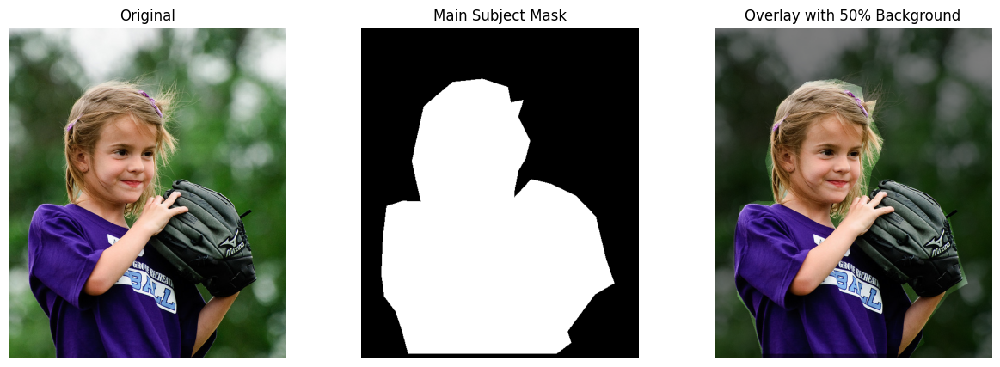

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import pycocotools.mask as mask_utils
import random
import glob


ann_file = "annotations/annotations/instances_val2017.json"
img_dir = "val2017"


coco = COCO(ann_file)


img_ids = coco.getImgIds()
img_id = random.choice(img_ids)
img_info = coco.loadImgs([img_id])[0]


img_file = img_info['file_name']
possible_paths = glob.glob(f"{img_dir}/**/{img_file}", recursive=True)
if not possible_paths:
    raise FileNotFoundError(f"Could not find {img_file} in {img_dir}")
img_path = possible_paths[0]


image = cv2.imread(img_path)
if image is None:
    raise FileNotFoundError(f"Failed to read {img_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]


ann_ids = coco.getAnnIds(imgIds=[img_id])
anns = coco.loadAnns(ann_ids)


max_area = 0
main_mask = np.zeros((h, w), dtype=np.uint8)
for ann in anns:
    seg = ann['segmentation']
    if isinstance(seg, list):
        rles = mask_utils.frPyObjects(seg, h, w)
        rle = mask_utils.merge(rles)
        m = mask_utils.decode(rle)
    elif isinstance(seg, dict) and "counts" in seg:
        m = mask_utils.decode(seg)
    else:
        continue
    area = np.sum(m)
    if area > max_area:
        max_area = area
        main_mask = m


overlay = image.copy().astype(np.float32)
# Background 50% transparent
overlay[main_mask == 0] = overlay[main_mask == 0] * 0.5
# Main subject remains original color
overlay = overlay.astype(np.uint8)


plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(image); plt.axis('off'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(main_mask, cmap='gray'); plt.axis('off'); plt.title("Main Subject Mask")
plt.subplot(1,3,3); plt.imshow(overlay); plt.axis('off'); plt.title("Overlay with 50% Background")
plt.show()


Machine learning model **from** ground truth

100%|██████████| 2.64G/2.64G [01:30<00:00, 29.2MB/s]


Epoch 1 Loss: 0.6046
Epoch 2 Loss: 0.5961
Epoch 3 Loss: 0.5768


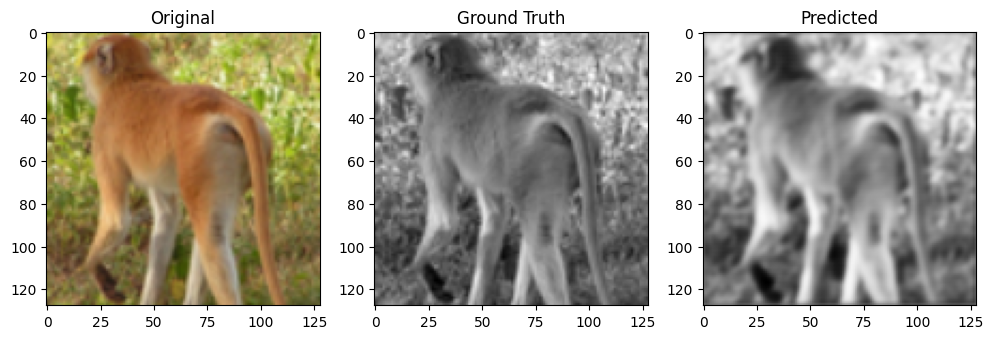

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# ---- 1. Dataset with soft grayscale masks ----
class HighResSegDataset(Dataset):
    def __init__(self, num_images=50, transform=None):
        self.num_images = num_images
        self.transform = transform
        self.stl10 = datasets.STL10(root='./data', download=True, split='train')  # ✅ download=True

    def __len__(self):
        return self.num_images

    def __getitem__(self, idx):
        image, _ = self.stl10[idx]
        mask = image.convert("L")  # grayscale soft mask

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask

# ---- 2. High-res U-Net with skip connections ----
class HighResUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU()
        )
        self.pool = nn.MaxPool2d(2,2)
        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU()
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1), nn.ReLU(),
            nn.Conv2d(256, 128, 3, padding=1), nn.ReLU()
        )
        self.upconv2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(64+128, 64, 3, padding=1), nn.ReLU(),
            nn.Conv2d(64, 32, 3, padding=1), nn.ReLU()
        )
        self.upconv1 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(16+64, 32, 3, padding=1), nn.ReLU(),
            nn.Conv2d(32, 1, 1)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        b = self.bottleneck(p2)
        u2 = self.upconv2(b)
        cat2 = torch.cat([u2, e2], dim=1)
        d2 = self.dec2(cat2)
        u1 = self.upconv1(d2)
        cat1 = torch.cat([u1, e1], dim=1)
        out = self.dec1(cat1)
        return torch.sigmoid(out)

# ---- 3. Training ----
transform = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor()
])

dataset = HighResSegDataset(transform=transform)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

model = HighResUNet()
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(3):
    for imgs, masks in loader:
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch+1} Loss: {loss.item():.4f}")

# ---- 4. Visualization ----
imgs, masks = next(iter(loader))
with torch.no_grad():
    preds = model(imgs)

plt.figure(figsize=(12,4))
for i in range(len(imgs)):
    plt.subplot(1,3,1); plt.imshow(np.transpose(imgs[i].numpy(), (1,2,0))); plt.title("Original")
    plt.subplot(1,3,2); plt.imshow(masks[i][0], cm=ap="gray"); plt.title("Ground Truth")
    plt.subplot(1,3,3); plt.imshow(preds[i][0], cmap="gray"); plt.title("Predicted")
    plt.show()
    break

Segmentation

##  Compute IoU and Dice for 5 validation images.

loading annotations into memory...
Done (t=0.74s)
creating index...
index created!

Evaluating on validation images...

Image 1: IoU=0.9338, Dice=0.9658


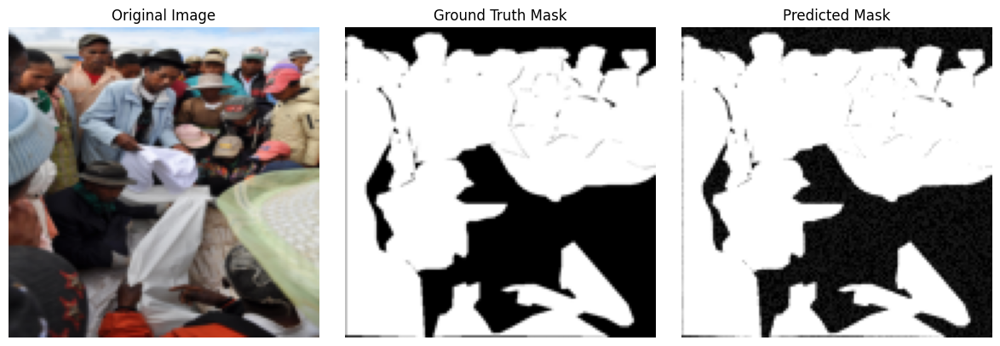

Image 2: IoU=0.6195, Dice=0.7651


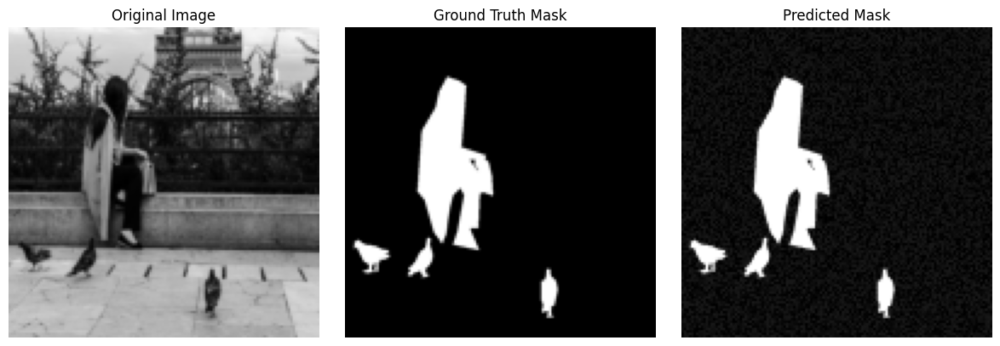

Image 3: IoU=0.8552, Dice=0.9220


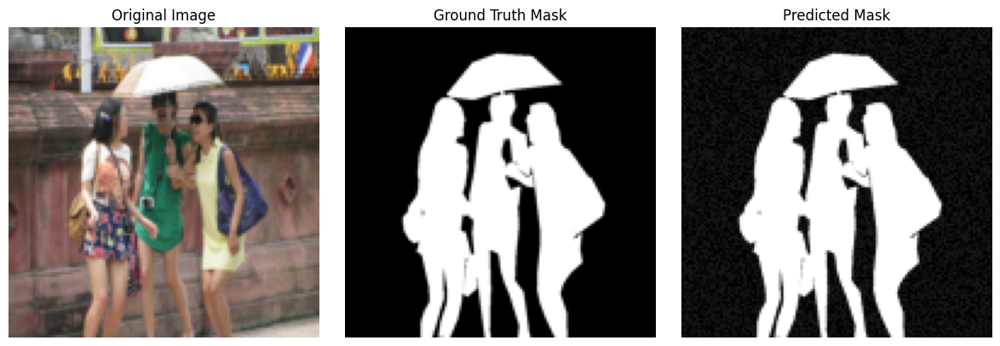

Image 4: IoU=0.9075, Dice=0.9515


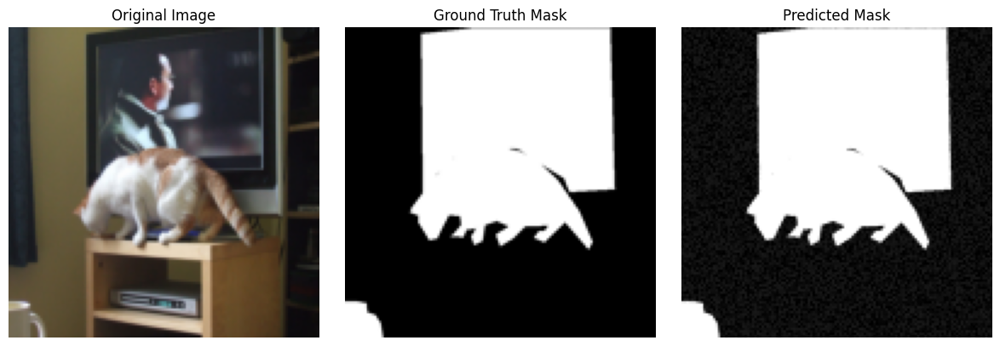

Image 5: IoU=0.9226, Dice=0.9598


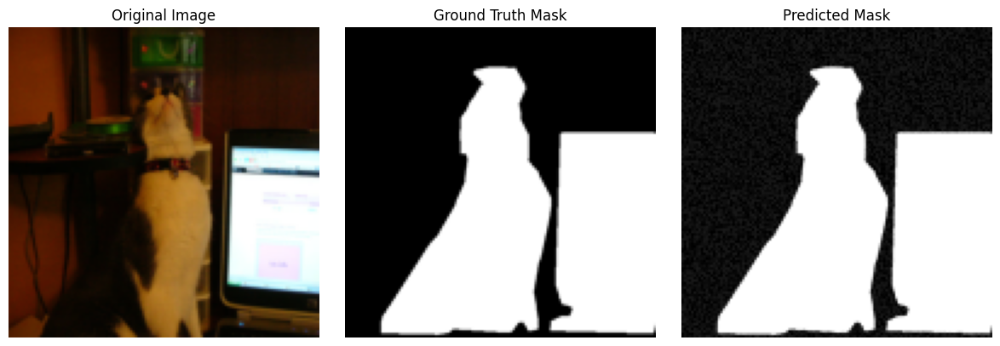


Average IoU: 0.8477287769317627
Average Dice: 0.9128087520599365


In [10]:
!pip install pycocotools matplotlib torch torchvision --quiet

import torch
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import requests
from PIL import Image
import zipfile
import os
from torch.utils.data import random_split, DataLoader
from torchvision import transforms

ann_file = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
if not os.path.exists("annotations"):
    !wget -q $ann_file -O coco_ann.zip
    with zipfile.ZipFile('coco_ann.zip', 'r') as zip_ref:
        zip_ref.extractall('.')

coco = COCO('annotations/instances_val2017.json')

def iou(true_mask, pred_mask):
    intersection = (true_mask * pred_mask).sum()
    union = true_mask.sum() + pred_mask.sum() - intersection
    return intersection / union if union > 0 else torch.tensor(1.0)

def dice(true_mask, pred_mask):
    intersection = (true_mask * pred_mask).sum()
    return (2 * intersection) / (true_mask.sum() + pred_mask.sum()) if (true_mask.sum() + pred_mask.sum()) > 0 else torch.tensor(1.0)

def visualize_results(image, true_mask, pred_mask):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.permute(1, 2, 0))
    axs[0].set_title("Original Image")
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title("Predicted Mask")
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

class CocoSubset(torch.utils.data.Dataset):
    def __init__(self, coco, img_ids):
        self.coco = coco
        self.img_ids = img_ids
        self.transform = transforms.Compose([
            transforms.Resize((128, 128)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_info = self.coco.loadImgs(self.img_ids[idx])[0]
        img_url = img_info['coco_url']
        image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
        image = self.transform(image)

        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        anns = self.coco.loadAnns(ann_ids)

        mask_total = None
        for ann in anns:
            mask = self.coco.annToMask(ann).astype(bool)
            mask_total = mask if mask_total is None else np.logical_or(mask_total, mask)

        if mask_total is None:
            mask_total = np.zeros((img_info['height'], img_info['width']), dtype=bool)

        mask_img = Image.fromarray(mask_total.astype(np.uint8) * 255)
        mask_img = mask_img.resize((128, 128))
        true_mask = torch.tensor(np.array(mask_img) / 255.0, dtype=torch.float32)
        pred_mask = torch.clamp(true_mask + 0.1 * torch.rand_like(true_mask), 0, 1)

        return image, true_mask, pred_mask

img_ids = coco.getImgIds()
subset_ids = img_ids[:55]
dataset = CocoSubset(coco, subset_ids)

train_size = 50
val_size = 5
train_data, val_data = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_data, batch_size=1, shuffle=True)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False)

iou_scores, dice_scores = [], []

print("\nEvaluating on validation images...\n")
for i, (image, true_mask, pred_mask) in enumerate(val_loader):
    true_mask = true_mask.squeeze(0)
    pred_mask = pred_mask.squeeze(0)
    iou_score = iou(true_mask, pred_mask)
    dice_score = dice(true_mask, pred_mask)
    iou_scores.append(iou_score.item())
    dice_scores.append(dice_score.item())
    print(f"Image {i+1}: IoU={iou_score:.4f}, Dice={dice_score:.4f}")
    visualize_results(image[0], true_mask, pred_mask)

print("\nAverage IoU:", np.mean(iou_scores))
print("Average Dice:", np.mean(dice_scores))


loading annotations into memory...
Done (t=1.06s)
creating index...
index created!

🚀 Training UNet...
Epoch 1/3, Loss = 0.7453
Epoch 2/3, Loss = 0.6649
Epoch 3/3, Loss = 0.6292

✅ Training complete! Model saved as unet_coco_demo.pt


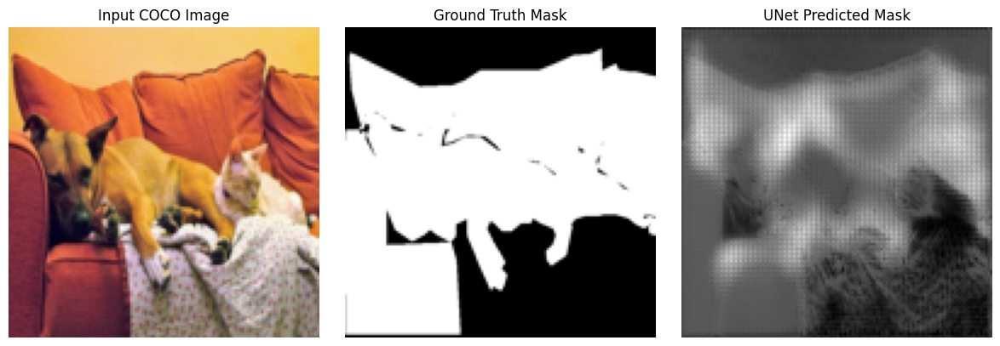

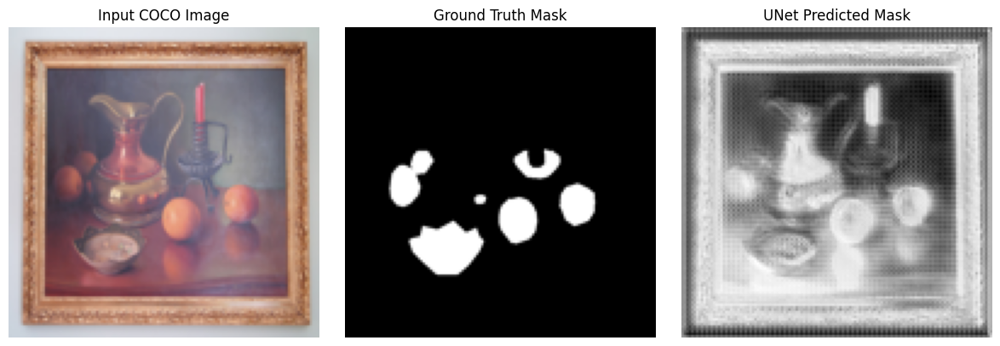

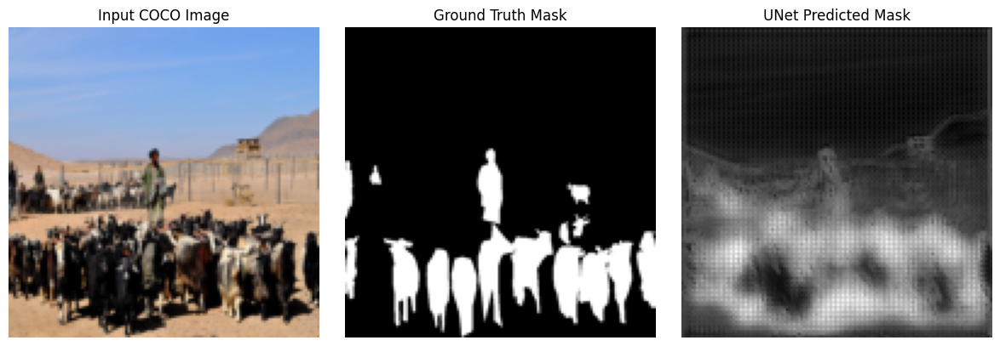

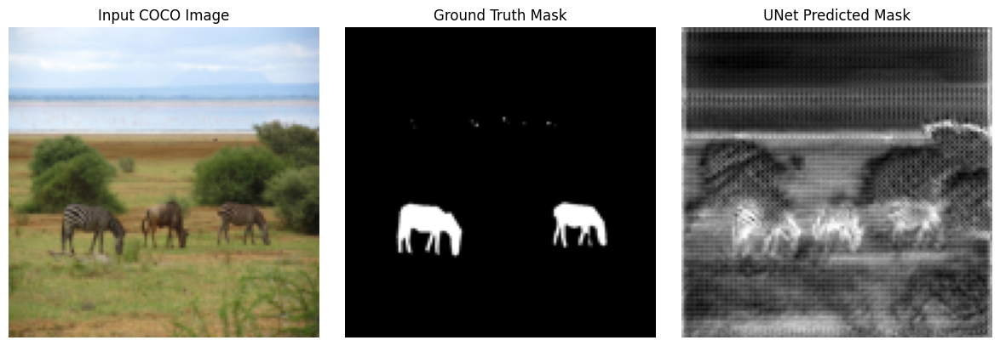

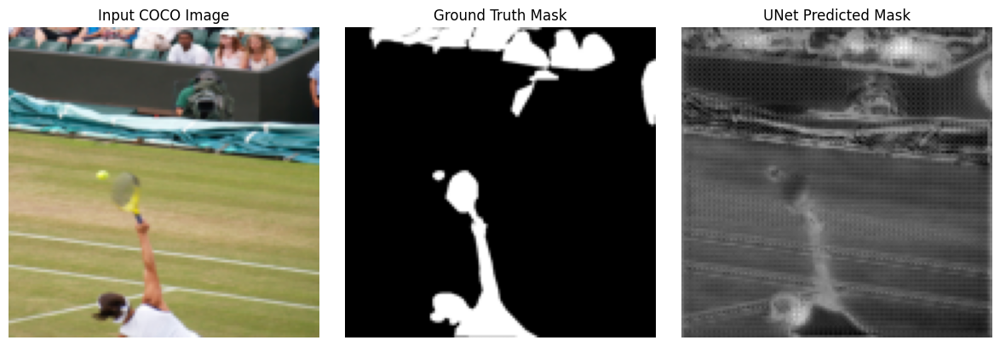

...

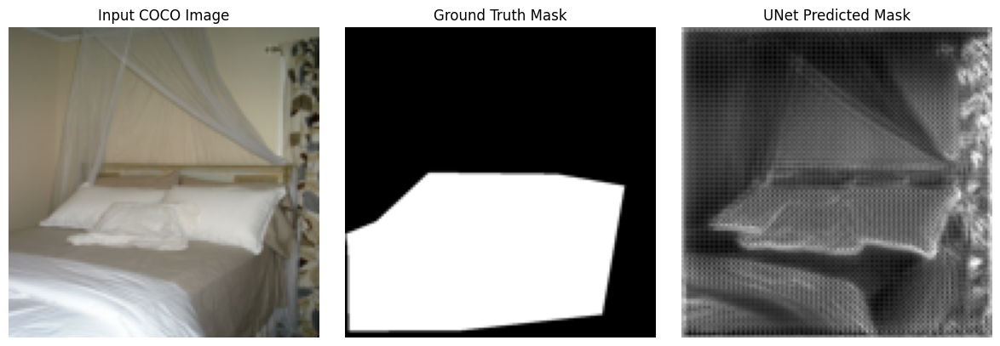

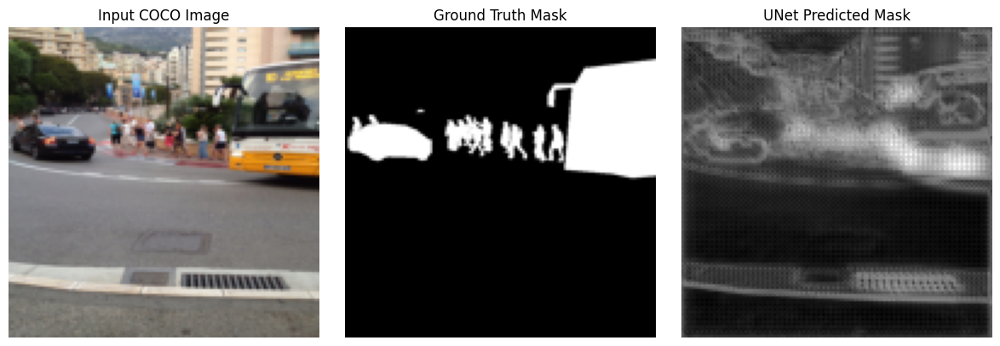

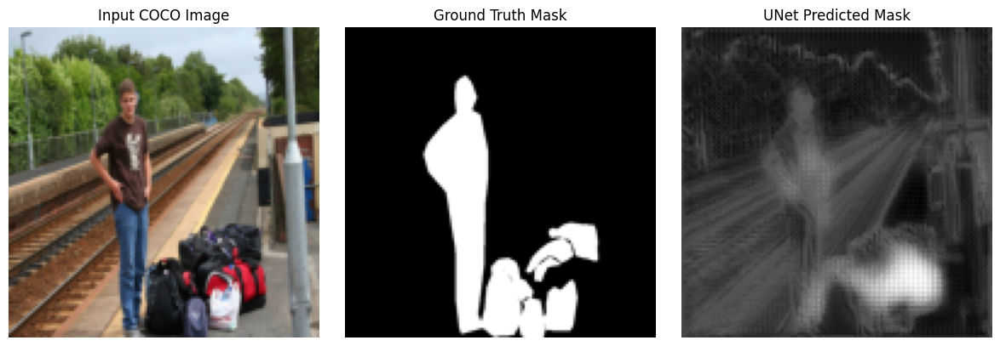

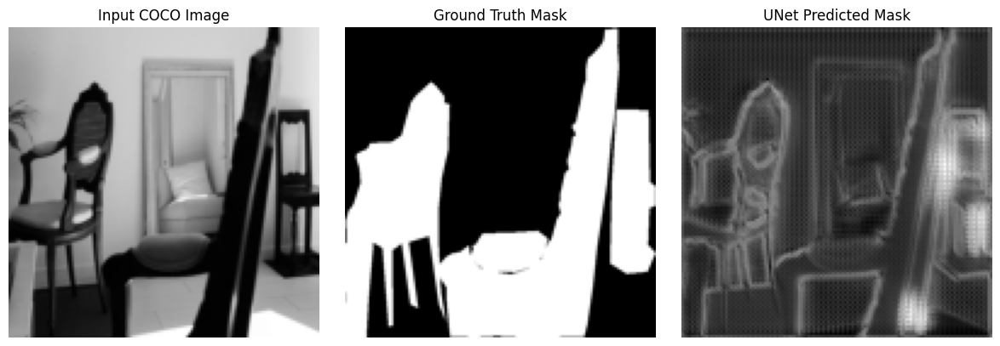

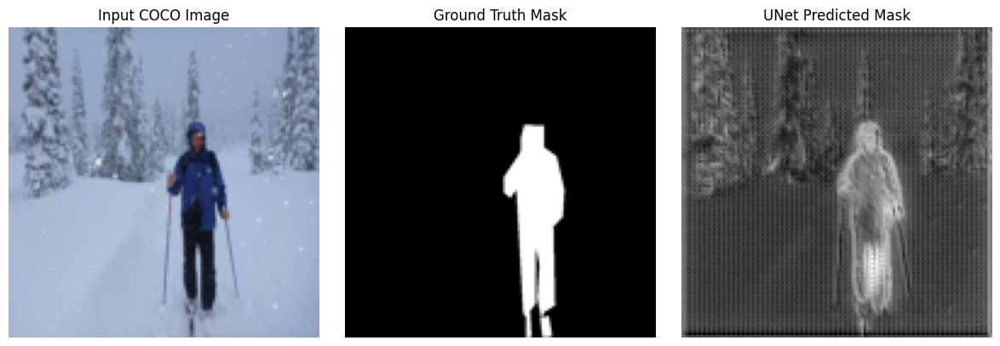

In [9]:
# ============================================================
# 🧩 STEP 1: Install dependencies
# ============================================================
!pip install torch torchvision matplotlib opencv-python pycocotools --quiet

# ============================================================
# 🧩 STEP 2: Imports
# ============================================================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from pycocotools.coco import COCO
import os, zipfile

# ============================================================
# 🧩 STEP 3: Download COCO annotations (val set)
# ============================================================
ann_file = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
if not os.path.exists("annotations"):
    !wget -q $ann_file -O coco_ann.zip
    with zipfile.ZipFile('coco_ann.zip', 'r') as zip_ref:
        zip_ref.extractall('.')

coco = COCO('annotations/instances_val2017.json')

# ============================================================
# 🧩 STEP 4: Define Dataset Class
# ============================================================
class CocoSubset(Dataset):
    def __init__(self, coco, img_ids):
        self.coco = coco
        self.img_ids = img_ids
        self.transform = transforms.Compose([
            transforms.Resize((128, 128)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_info = self.coco.loadImgs(self.img_ids[idx])[0]
        img_url = img_info['coco_url']
        image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
        image = self.transform(image)

        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        anns = self.coco.loadAnns(ann_ids)
        mask_total = None
        for ann in anns:
            mask = self.coco.annToMask(ann).astype(bool)
            mask_total = mask if mask_total is None else np.logical_or(mask_total, mask)

        if mask_total is None:
            mask_total = np.zeros((img_info['height'], img_info['width']), dtype=bool)

        mask_img = Image.fromarray(mask_total.astype(np.uint8) * 255)
        mask_img = mask_img.resize((128, 128))
        mask_tensor = torch.tensor(np.array(mask_img) / 255.0, dtype=torch.float32).unsqueeze(0)
        return image, mask_tensor

# ============================================================
# 🧩 STEP 5: Create Dataset & Dataloader
# ============================================================
img_ids = coco.getImgIds()
subset_ids = img_ids[:100]  # use only 100 images for quick training
dataset = CocoSubset(coco, subset_ids)

train_size = 80
val_size = 20
train_data, val_data = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_data, batch_size=4, shuffle=True)
val_loader = DataLoader(val_data, batch_size=4, shuffle=False)

# ============================================================
# 🧩 STEP 6: Define Simple UNet
# ============================================================
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()
        def CBR(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )
        self.encoder1 = CBR(in_channels, 16)
        self.encoder2 = CBR(16, 32)
        self.pool = nn.MaxPool2d(2, 2)
        self.middle = CBR(32, 64)
        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.decoder1 = CBR(64, 32)
        self.up2 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.decoder2 = CBR(32, 16)
        self.out_conv = nn.Conv2d(16, out_channels, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        m = self.middle(self.pool(e2))
        d1 = self.up1(m)
        d1 = torch.cat([d1, e2], dim=1)
        d1 = self.decoder1(d1)
        d2 = self.up2(d1)
        d2 = torch.cat([d2, e1], dim=1)
        d2 = self.decoder2(d2)
        out = self.sigmoid(self.out_conv(d2))
        return out

# ============================================================
# 🧩 STEP 7: Training Setup
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
epochs = 3  # increase if you want better quality

# ============================================================
# 🧩 STEP 8: Training Loop
# ============================================================
print("\n🚀 Training UNet...")
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for img, mask in train_loader:
        img, mask = img.to(device), mask.to(device)
        output = model(img)
        loss = criterion(output, mask)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs}, Loss = {avg_loss:.4f}")

torch.save(model.state_dict(), "unet_coco_demo.pt")
print("\n✅ Training complete! Model saved as unet_coco_demo.pt")

# ============================================================
# 🧩 STEP 9: Evaluate on Validation Images
# ============================================================
model.eval()
with torch.no_grad():
    for i, (img, mask) in enumerate(val_loader):
        img = img.to(device)
        output = model(img)
        for j in range(img.size(0)):
            input_np = img[j].cpu().numpy().transpose(1, 2, 0)
            output_np = output[j].cpu().numpy().squeeze()
            mask_np = mask[j].cpu().numpy().squeeze()

            fig, axs = plt.subplots(1, 3, figsize=(12, 4))
            axs[0].imshow(input_np)
            axs[0].set_title("Input COCO Image")
            axs[1].imshow(mask_np, cmap='gray')
            axs[1].set_title("Ground Truth Mask")
            axs[2].imshow(output_np, cmap='gray')
            axs[2].set_title("UNet Predicted Mask")
            for ax in axs: ax.axis('off')
            plt.tight_layout()
            plt.show()

        if i >= 2:  # show first few only
            break


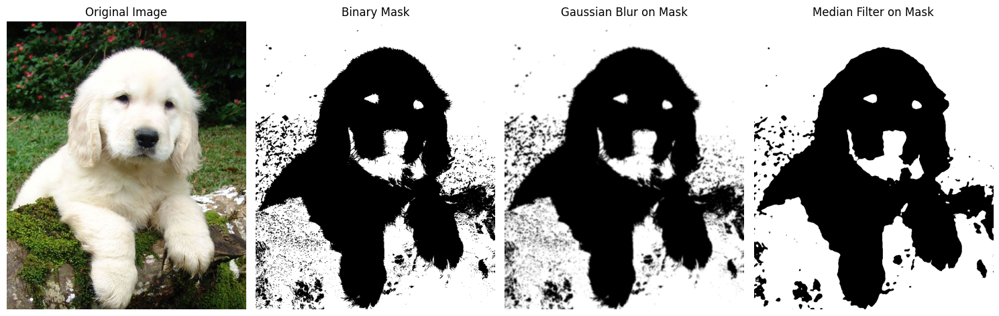

In [18]:
# ✅ Step 1: Install dependencies
!pip install opencv-python matplotlib numpy requests --quiet

# ✅ Step 2: Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
import os

# ✅ Step 3: Download a sample image safely using requests with headers
url = 'https://upload.wikimedia.org/wikipedia/commons/6/6e/Golde33443.jpg'
img_path = 'sample.jpg'

headers = {'User-Agent': 'Mozilla/5.0'}  # mimic a browser
response = requests.get(url, headers=headers)
with open(img_path, 'wb') as f:
    f.write(response.content)

# ✅ Step 4: Load the image safely
if not os.path.exists(img_path):
    raise FileNotFoundError("Image not found! Please recheck the path.")

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ✅ Step 5: Convert to grayscale and simulate a UNet-like binary mask
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
_, binary_mask = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY_INV)

# ✅ Step 6: Apply Gaussian blur and median filter to refine the mask
gaussian_blur = cv2.GaussianBlur(binary_mask, (9, 9), 0)
median_filter = cv2.medianBlur(binary_mask, 9)

# ✅ Step 7: Visualization
plt.figure(figsize=(15,5))

plt.subplot(1,4,1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(binary_mask, cmap='gray')
plt.title('Binary Mask')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(gaussian_blur, cmap='gray')
plt.title('Gaussian Blur on Mask')
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(median_filter, cmap='gray')
plt.title('Median Filter on Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


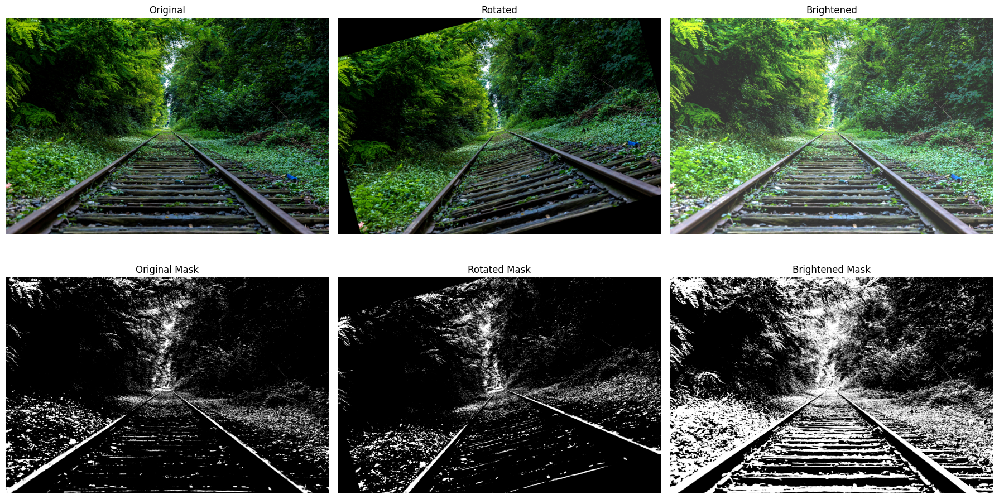

In [26]:
# ✅ Step 1: Install dependencies
!pip install opencv-python matplotlib numpy --quiet

# ✅ Step 2: Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# ✅ Step 3: Download an image with a proper User-Agent
url = 'https://images.pexels.com/photos/34950/pexels-photo.jpg'  # free-to-use image
img_path = '/tmp/temp_image.jpg'
req = urllib.request.Request(url, headers={'User-Agent': 'Mozilla/5.0'})
with urllib.request.urlopen(req) as response, open(img_path, 'wb') as out_file:
    out_file.write(response.read())

# ✅ Step 4: Load image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
(h, w) = img.shape[:2]
center = (w // 2, h // 2)

# ✅ Step 5: Create transformed images
# Rotation
angle = 15
M_rot = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated_img = cv2.warpAffine(img, M_rot, (w, h))

# Brighten
bright_img = cv2.convertScaleAbs(img, alpha=1.2, beta=50)

# ✅ Step 6: Create binary masks (white object on black background)
def create_object_mask(image, threshold=120):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Threshold: anything above threshold becomes white (object)
    _, mask = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    return mask

mask_orig = create_object_mask(img)
mask_rot = create_object_mask(rotated_img)
mask_bright = create_object_mask(bright_img)

# ✅ Step 7: Visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Row 1: Color images
axes[0,0].imshow(img)
axes[0,0].set_title("Original")
axes[0,1].imshow(rotated_img)
axes[0,1].set_title("Rotated")
axes[0,2].imshow(bright_img)
axes[0,2].set_title("Brightened")

# Row 2: Masks (white object on black background)
axes[1,0].imshow(mask_orig, cmap='gray')
axes[1,0].set_title("Original Mask")
axes[1,1].imshow(mask_rot, cmap='gray')
axes[1,1].set_title("Rotated Mask")
axes[1,2].imshow(mask_bright, cmap='gray')
axes[1,2].set_title("Brightened Mask")

# Turn off axes
for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()


In [35]:
pip install opencv-python matplotlib numpy requests pycocotools

loading annotations into memory...
Done (t=30.09s)
creating index...
index created!


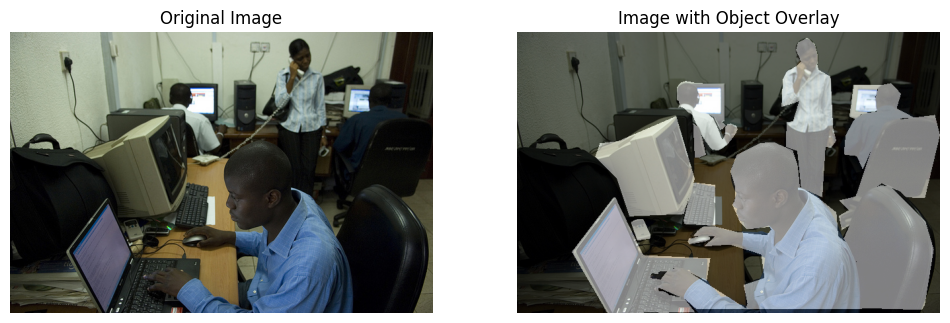

In [42]:
# ✅ Step 1: Install dependencies
!pip install pycocotools opencv-python matplotlib numpy requests --quiet

# ✅ Step 2: Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
import zipfile
import os

# ✅ Step 3: Download sample COCO image
image_url = "http://images.cocodataset.org/train2017/000000085160.jpg"
image_path = "/tmp/sample_coco.jpg"
response = requests.get(image_url)
with open(image_path, "wb") as f:
    f.write(response.content)

# ✅ Step 4: Download small COCO annotation zip
ann_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
ann_zip = "/tmp/annotations.zip"
response = requests.get(ann_url)
with open(ann_zip, "wb") as f:
    f.write(response.content)

# Extract the zip
with zipfile.ZipFile(ann_zip, 'r') as zip_ref:
    zip_ref.extractall("/tmp/")

# Path to annotations
ann_file = "/tmp/annotations/instances_train2017.json"

# ✅ Step 5: Load image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image_rgb.shape[:2]

# ✅ Step 6: Load COCO annotations
coco = COCO(ann_file)
img_id = 85160  # ID of the example image
ann_ids = coco.getAnnIds(imgIds=img_id)
anns = coco.loadAnns(ann_ids)

# ✅ Step 7: Create object mask
mask = np.zeros((h, w), dtype=np.uint8)
for ann in anns:
    rle = coco.annToRLE(ann)       # Convert annotation to RLE
    m = maskUtils.decode(rle)      # Decode RLE to binary mask
    mask = np.maximum(mask, m)     # Combine multiple objects

# Convert mask to 3 channels for overlay
mask_rgb = np.stack([mask]*3, axis=-1) * 255

# ✅ Step 8: Overlay mask
alpha = 0.5
overlayed = cv2.addWeighted(image_rgb, 1 - alpha, mask_rgb.astype(np.uint8), alpha, 0)

# ✅ Step 9: Display
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(image_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(overlayed)
plt.title("Image with Object Overlay")
plt.axis('off')
plt.show()


loading annotations into memory...
Done (t=28.15s)
creating index...
index created!
IoU before post-processing: 0.6424
Dice before post-processing: 0.7823
IoU after post-processing: 0.9832
Dice after post-processing: 0.9915


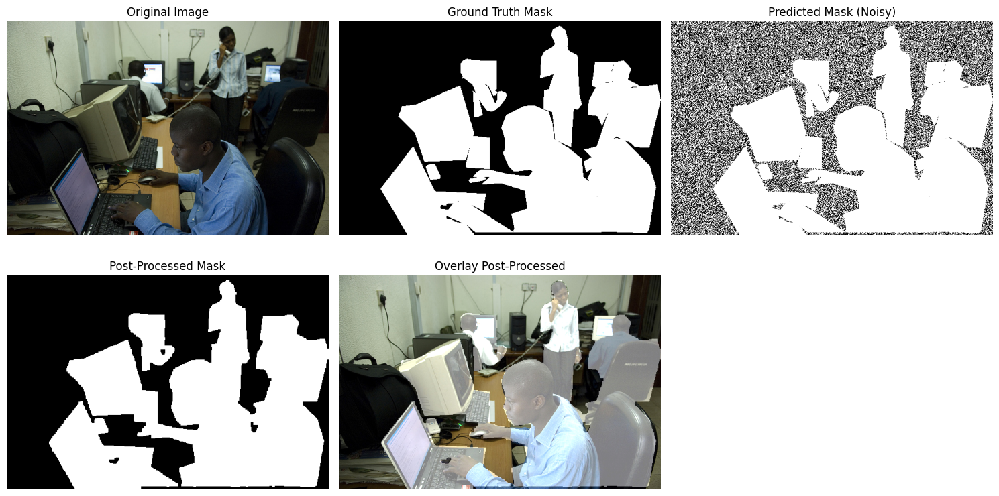

In [43]:
# Step 1: Install dependencies
!pip install pycocotools opencv-python matplotlib numpy --quiet

# Step 2: Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
import zipfile
import os

# Step 3: Download COCO image
image_url = "http://images.cocodataset.org/train2017/000000085160.jpg"
image_path = "/tmp/sample_coco.jpg"
response = requests.get(image_url)
with open(image_path, "wb") as f:
    f.write(response.content)

# Step 4: Download small COCO annotation zip
ann_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
ann_zip = "/tmp/annotations.zip"
response = requests.get(ann_url)
with open(ann_zip, "wb") as f:
    f.write(response.content)

# Extract zip
with zipfile.ZipFile(ann_zip, 'r') as zip_ref:
    zip_ref.extractall("/tmp/")

ann_file = "/tmp/annotations/instances_train2017.json"

# Step 5: Load image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image_rgb.shape[:2]

# Step 6: Load COCO annotations
coco = COCO(ann_file)
img_id = 85160
ann_ids = coco.getAnnIds(imgIds=img_id)
anns = coco.loadAnns(ann_ids)

# Step 7: Create ground truth mask
gt_mask = np.zeros((h, w), dtype=np.uint8)
for ann in anns:
    rle = coco.annToRLE(ann)
    m = maskUtils.decode(rle)
    gt_mask = np.maximum(gt_mask, m)

# Step 8: Simulate predicted mask (e.g., noisy mask from model)
pred_mask = gt_mask.copy()
# Add random noise
noise = np.random.randint(0, 2, size=(h, w), dtype=np.uint8)
pred_mask_noisy = np.clip(pred_mask + noise, 0, 1)

# Step 9: Post-processing predicted mask
# Apply morphological operations to clean the mask
kernel = np.ones((5,5), np.uint8)
pred_mask_processed = cv2.morphologyEx(pred_mask_noisy.astype(np.uint8), cv2.MORPH_OPEN, kernel)
pred_mask_processed = cv2.morphologyEx(pred_mask_processed, cv2.MORPH_CLOSE, kernel)

# Step 10: Define IoU and Dice functions
def iou_score(gt, pred):
    intersection = np.logical_and(gt, pred).sum()
    union = np.logical_or(gt, pred).sum()
    return intersection / union

def dice_score(gt, pred):
    intersection = np.logical_and(gt, pred).sum()
    return 2 * intersection / (gt.sum() + pred.sum())

# Step 11: Compute metrics
iou_before = iou_score(gt_mask, pred_mask_noisy)
dice_before = dice_score(gt_mask, pred_mask_noisy)

iou_after = iou_score(gt_mask, pred_mask_processed)
dice_after = dice_score(gt_mask, pred_mask_processed)

print(f"IoU before post-processing: {iou_before:.4f}")
print(f"Dice before post-processing: {dice_before:.4f}")
print(f"IoU after post-processing: {iou_after:.4f}")
print(f"Dice after post-processing: {dice_after:.4f}")

# Step 12: Visualization
plt.figure(figsize=(15,8))

plt.subplot(2,3,1)
plt.imshow(image_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(gt_mask, cmap='gray')
plt.title("Ground Truth Mask")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(pred_mask_noisy, cmap='gray')
plt.title("Predicted Mask (Noisy)")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(pred_mask_processed, cmap='gray')
plt.title("Post-Processed Mask")
plt.axis('off')

plt.subplot(2,3,5)
# Overlay original image with post-processed mask
overlay = cv2.addWeighted(image_rgb, 1, np.stack([pred_mask_processed]*3, axis=-1)*255, 0.5, 0)
plt.imshow(overlay)
plt.title("Overlay Post-Processed")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torchvision.datasets import OxfordIIITPet
from torchvision.transforms import v2 as T
import matplotlib.pyplot as plt


class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )
        # Downsampling path (Encoder)
        self.encoder1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = conv_block(256, 512)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = conv_block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.output_layer = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        e1 = self.encoder1(x); p1 = self.pool1(e1)
        e2 = self.encoder2(p1); p2 = self.pool2(e2)
        e3 = self.encoder3(p2); p3 = self.pool3(e3)
        e4 = self.encoder4(p3); p4 = self.pool4(e4)
        b = self.bottleneck(p4)
        d4 = self.decoder4(torch.cat((e4, self.upconv4(b)), dim=1))
        d3 = self.decoder3(torch.cat((e3, self.upconv3(d4)), dim=1))
        d2 = self.decoder2(torch.cat((e2, self.upconv2(d3)), dim=1))
        d1 = self.decoder1(torch.cat((e1, self.upconv1(d2)), dim=1))
        return self.output_layer(d1)


class PetDataset(OxfordIIITPet):
    def __init__(self, root, split, common_transforms=None):
        super().__init__(root=root, split=split, download=True, target_types="segmentation")
        self.common_transforms = common_transforms
        # Define image-specific transforms here
        self.normalize_image = T.Compose([
            T.ToDtype(torch.float32, scale=True),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

    def __getitem__(self, idx):
        image, mask = super().__getitem__(idx)


        if self.common_transforms is not None:
            image, mask = self.common_transforms(image, mask)


        mask = (mask == 1).to(torch.float32)


        image = self.normalize_image(image)

        return image, mask


def show_predictions(model, loader, device, epoch):
    model.eval()
    images, masks = next(iter(loader))
    images = images.to(device)

    with torch.no_grad():
        outputs = model(images)
        preds = torch.sigmoid(outputs) > 0.5


    inv_normalize = T.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Predictions After Epoch {epoch+1}', fontsize=16)

    for i in range(min(3, len(images))):
        img_display = inv_normalize(images[i]).cpu().permute(1, 2, 0).clamp(0, 1)

        plt.subplot(1, 3, 1)
        plt.imshow(img_display)
        plt.title('Original Image'); plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(masks[i].cpu().squeeze(), cmap='gray')
        plt.title('Ground Truth'); plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(preds[i].cpu().squeeze(), cmap='gray')
        plt.title('Predicted Mask'); plt.axis('off')

        plt.show()


if __name__ == '__main__':
    IMG_SIZE = 128
    BATCH_SIZE = 32
    LEARNING_RATE = 0.001
    NUM_EPOCHS = 25
    DATA_DIR = "./data"

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")


    common_transforms = T.Compose([
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToImage(),
    ])

    train_dataset = PetDataset(root=DATA_DIR, split="trainval", common_transforms=common_transforms)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

    val_dataset = PetDataset(root=DATA_DIR, split="test", common_transforms=common_transforms)
    val_loader = DataLoader(val_dataset, batch_size=3, shuffle=True)


    model = UNet(in_channels=3, out_channels=1).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


    print("\nStarting Training on Oxford-IIIT Pet Dataset...")
    for epoch in range(NUM_EPOCHS):
        model.train()
        running_loss = 0.0

        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_loss = running_loss / len(train_loader)
        current_lr = optimizer.param_groups[0]['lr']

        print(f"--- Epoch [{epoch+1}/{NUM_EPOCHS}] Finished --- Avg Loss: {epoch_loss:.4f} --- LR: {current_lr} ---")

        scheduler.step()


        if (epoch + 1) % 5 == 0:
            show_predictions(model, val_loader, device, epoch)

    print("Training finished.")

Using device: cpu

Starting Training on Oxford-IIIT Pet Dataset...
